<a href="https://colab.research.google.com/github/OguzKortun/nlp-project/blob/main/Yazan_Zeka_nlp_projesi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
pd.options.mode.chained_assignment = None
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import re, os, glob
import nltk
import string
import sys
import nltk
nltk.download('wordnet')

from sklearn.metrics import f1_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.manifold import TSNE
from urllib.request import urlopen
from bs4 import BeautifulSoup
import gensim
from gensim.models import Word2Vec
nltk.download('punkt')
from gensim import corpora, models, similarities


pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.width', 5000)
pd.options.display.max_columns = None

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


In [ ]:
df= pd.read_csv("nlp_proje_metin_siniflandirma.csv",index_col=0)
df.info()

FileNotFoundError: ignored

In [ ]:
df.describe()

,Label
count,3000.000
mean,2.067
std,0.753
min,1.000
25%,1.000
50%,2.000
75%,3.000
max,3.000


In [ ]:
df

,Text,Label
0,turkcellmüzik biraz daha gelişsin fizy yi tama...,1
1,hayat paylaşınca güzel...türkcell...,1
2,superonline varya daha iyi,1
3,hahaha kanka turkcell bu 4 ceker :d,1
4,turkcell 3 tl hediye etse bana ne güzel olur =),1
5,eğer bir gün isterseniz siz de turkcell kampan...,1
6,superonline tabiki :),1
7,ben teşekkür ederim:) hayat paylaşınca güzel d...,1
8,tabiki hayat paylaşınca güzel :)) sohbetin çok...,1
9,&amp; sen neleri cozmussun burası ne ki senin ...,1


In [ ]:
df.head()

,Text,Label
0,turkcellmüzik biraz daha gelişsin fizy yi tama...,1
1,hayat paylaşınca güzel...türkcell...,1
2,superonline varya daha iyi,1
3,hahaha kanka turkcell bu 4 ceker :d,1
4,turkcell 3 tl hediye etse bana ne güzel olur =),1


In [ ]:
df.loc[100, "Text"]

'busefer kazanan ben oldum bak turkcell.aksam 9 sabah 6,120tl bedava vermissin.hicte uyku saatim degil.carcur ettik daha da edicez bil yani'

In [ ]:
df["Text"]

0       turkcellmüzik biraz daha gelişsin fizy yi tama...
1                    hayat paylaşınca güzel...türkcell...
2                              superonline varya daha iyi
3                     hahaha kanka turkcell bu 4 ceker :d
4         turkcell 3 tl hediye etse bana ne güzel olur =)
5       eğer bir gün isterseniz siz de turkcell kampan...
6                                   superonline tabiki :)
7       ben teşekkür ederim:) hayat paylaşınca güzel d...
8       tabiki hayat paylaşınca güzel :)) sohbetin çok...
9       &amp; sen neleri cozmussun burası ne ki senin ...
10               bendeniz #turkcell e geçmiş bulunuyorum.
11      butun cuma gunleri boyle olsa.. :)) turkcell #...
12      onunda bir iphone 4s si olsun haydi türkcell y...
13      bu şarkıya bayıldım  o_o cok yakında turkcell ...
14       lan turkcell e bak yeni cihaz veriyormuş sonunda
15      en yeni en iyi iphone 4s interneti ile birlikt...
16      girmezmiyim.. turkcell kartim bile var.. yarin...
17      " bahç

In [ ]:
df["Text"]=df["Text"].str.strip()

In [ ]:
df["Text"].head()

0    turkcellmüzik biraz daha gelişsin fizy yi tama...
1                 hayat paylaşınca güzel...türkcell...
2                           superonline varya daha iyi
3                  hahaha kanka turkcell bu 4 ceker :d
4      turkcell 3 tl hediye etse bana ne güzel olur =)
Name: Text, dtype: object

In [ ]:
df.dropna(inplace=True)
df.head()
df.reset_index(drop=True, inplace=True)

In [ ]:
txt=re.sub("[^a-zA-Züıçğşö]", " ", df.Text[1])
txt

'hayat paylaşınca güzel   türkcell   '

In [ ]:
txtbol=txt.split()
txtbol

['hayat', 'paylaşınca', 'güzel', 'türkcell']

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
STOP_WORDS = nltk.corpus.stopwords.words()

In [ ]:
source = urlopen("https://github.com/stopwords-iso/stopwords-tr/blob/master/stopwords-tr.txt").read()
soup = BeautifulSoup(source, "lxml")
print(set([text.parent.name for text in soup.find_all(text=True)]))

{'label', 'h1', 'strong', 'input-demux', 'li', 'html', 'details', 'details-dialog', 'head', 'svg', 'tr', 'ul', 'clipboard-copy', 'ref-selector', '[document]', 'div', 'details-menu', 'span', 'tab-container', 'a', 'modal-dialog', 'h3', 'include-fragment', 'template', 'nav', 'summary', 'title', 'footer', 'table', 'body', 'button', 'form', 'main', 'header', 'turbo-frame', 'h2', 'td'}


<ipython-input-194-2ebe5de941ab>:3: DeprecationWarning: The 'text' argument to find()-type methods is deprecated. Use 'string' instead.
  print(set([text.parent.name for text in soup.find_all(text=True)]))


In [ ]:
stopwords = ''

for paragraph in soup.find_all("tr"):
    stopwords += paragraph.text

stopwords = stopwords.split()
stopwords

['acaba',
 'acep',
 'adamakıllı',
 'adeta',
 'ait',
 'altmýþ',
 'altmış',
 'altý',
 'altı',
 'ama',
 'amma',
 'anca',
 'ancak',
 'arada',
 'artýk',
 'aslında',
 'aynen',
 'ayrıca',
 'az',
 'açıkça',
 'açıkçası',
 'bana',
 'bari',
 'bazen',
 'bazý',
 'bazı',
 'başkası',
 'baţka',
 'belki',
 'ben',
 'benden',
 'beni',
 'benim',
 'beri',
 'beriki',
 'beþ',
 'beş',
 'beţ',
 'bilcümle',
 'bile',
 'bin',
 'binaen',
 'binaenaleyh',
 'bir',
 'biraz',
 'birazdan',
 'birbiri',
 'birden',
 'birdenbire',
 'biri',
 'birice',
 'birileri',
 'birisi',
 'birkaç',
 'birkaçı',
 'birkez',
 'birlikte',
 'birçok',
 'birçoğu',
 'birþey',
 'birþeyi',
 'birşey',
 'birşeyi',
 'birţey',
 'bitevi',
 'biteviye',
 'bittabi',
 'biz',
 'bizatihi',
 'bizce',
 'bizcileyin',
 'bizden',
 'bize',
 'bizi',
 'bizim',
 'bizimki',
 'bizzat',
 'boşuna',
 'bu',
 'buna',
 'bunda',
 'bundan',
 'bunlar',
 'bunları',
 'bunların',
 'bunu',
 'bunun',
 'buracıkta',
 'burada',
 'buradan',
 'burası',
 'böyle',
 'böylece',
 'böylecene',


In [ ]:
text = df["Text"]
text.head()

0    turkcellmüzik biraz daha gelişsin fizy yi tama...
1                 hayat paylaşınca güzel...türkcell...
2                           superonline varya daha iyi
3                  hahaha kanka turkcell bu 4 ceker :d
4      turkcell 3 tl hediye etse bana ne güzel olur =)
Name: Text, dtype: object

In [ ]:
# harf olmayan karakterleri boşluk yapar ve stopwords dışındaki kelimeleri seçer
liste=[]
for j in range(len(df)):
    txt = re.sub("[^a-zA-ZüığıçöşÇŞİÜĞÖ]", ' ', df.Text[j])
    txt = txt.lower()
    txt = txt.split()
    txt = [i for i in txt if i not in stopwords]
    txttotal = " ".join(txt)
    liste.append(txttotal)

In [ ]:
liste

['turkcellmüzik gelişsin fizy yi bırakıcam söz',
 'hayat paylaşınca güzel türkcell',
 'superonline varya',
 'hahaha kanka turkcell ceker d',
 'turkcell tl hediye etse güzel',
 'gün isterseniz turkcell kampanyalarından yararlanabilirsiniz hal turkcell li diil misiniz',
 'superonline tabiki',
 'teşekkür ederim hayat paylaşınca güzel desek turkcell sponsor olurmu',
 'tabiki hayat paylaşınca güzel sohbetin hoşmuş yaa',
 'amp neleri cozmussun icin sekerim turkcell reklamı yorumun şahane tebrikler canım',
 'bendeniz turkcell e geçmiş bulunuyorum',
 'butun cuma gunleri boyle turkcell pazarlamakonferansi charlene li',
 'onunda iphone s si haydi türkcell yap güzelliği yada aramızda para toplayalım filan',
 'şarkıya bayıldım cok turkcell inde yeni yıl jingle cıkar',
 'lan turkcell e bak yeni cihaz veriyormuş',
 'yeni iphone s interneti tl den başlayan tekliflerle turkcell farkıyla',
 'girmezmiyim turkcell kartim yarindan takicam twittersiz denedim gun yapabildim',
 'bahçeşehir univ tesekkurler t

In [ ]:
df["liste"] = liste
df

,Text,Label,liste
0,turkcellmüzik biraz daha gelişsin fizy yi tama...,1,turkcellmüzik gelişsin fizy yi bırakıcam söz
1,hayat paylaşınca güzel...türkcell...,1,hayat paylaşınca güzel türkcell
2,superonline varya daha iyi,1,superonline varya
3,hahaha kanka turkcell bu 4 ceker :d,1,hahaha kanka turkcell ceker d
4,turkcell 3 tl hediye etse bana ne güzel olur =),1,turkcell tl hediye etse güzel
5,eğer bir gün isterseniz siz de turkcell kampan...,1,gün isterseniz turkcell kampanyalarından yarar...
6,superonline tabiki :),1,superonline tabiki
7,ben teşekkür ederim:) hayat paylaşınca güzel d...,1,teşekkür ederim hayat paylaşınca güzel desek t...
8,tabiki hayat paylaşınca güzel :)) sohbetin çok...,1,tabiki hayat paylaşınca güzel sohbetin hoşmuş yaa
9,&amp; sen neleri cozmussun burası ne ki senin ...,1,amp neleri cozmussun icin sekerim turkcell rek...


In [ ]:
# tek karakterleri kaldırma
list2=[]
for j in range(2999):
    txt=re.sub(r"(?:^| )\w(?:$| )",' ', df.liste[j])
    txt = txt.lower()
    txt=txt.split()
    txt=[i for i in txt if i not in stopwords]
    txttotal=" ".join(txt)
    list2.append(txttotal)


In [ ]:
list2

['turkcellmüzik gelişsin fizy yi bırakıcam söz',
 'hayat paylaşınca güzel türkcell',
 'superonline varya',
 'hahaha kanka turkcell ceker',
 'turkcell tl hediye etse güzel',
 'gün isterseniz turkcell kampanyalarından yararlanabilirsiniz hal turkcell li diil misiniz',
 'superonline tabiki',
 'teşekkür ederim hayat paylaşınca güzel desek turkcell sponsor olurmu',
 'tabiki hayat paylaşınca güzel sohbetin hoşmuş yaa',
 'amp neleri cozmussun icin sekerim turkcell reklamı yorumun şahane tebrikler canım',
 'bendeniz turkcell geçmiş bulunuyorum',
 'butun cuma gunleri boyle turkcell pazarlamakonferansi charlene li',
 'onunda iphone si haydi türkcell yap güzelliği yada aramızda para toplayalım filan',
 'şarkıya bayıldım cok turkcell inde yeni yıl jingle cıkar',
 'lan turkcell bak yeni cihaz veriyormuş',
 'yeni iphone interneti tl den başlayan tekliflerle turkcell farkıyla',
 'girmezmiyim turkcell kartim yarindan takicam twittersiz denedim gun yapabildim',
 'bahçeşehir univ tesekkurler türkiye ye 

In [ ]:
df["list2"] = list2
df.head()

,Text,Label,liste,list2
0,turkcellmüzik biraz daha gelişsin fizy yi tama...,1,turkcellmüzik gelişsin fizy yi bırakıcam söz,turkcellmüzik gelişsin fizy yi bırakıcam söz
1,hayat paylaşınca güzel...türkcell...,1,hayat paylaşınca güzel türkcell,hayat paylaşınca güzel türkcell
2,superonline varya daha iyi,1,superonline varya,superonline varya
3,hahaha kanka turkcell bu 4 ceker :d,1,hahaha kanka turkcell ceker d,hahaha kanka turkcell ceker
4,turkcell 3 tl hediye etse bana ne güzel olur =),1,turkcell tl hediye etse güzel,turkcell tl hediye etse güzel


In [ ]:
# temizlenmiş metinden en çok kullanılan 200 kelimeyi bulma
#kelime frekansı
from collections import Counter
Counter(" ".join(list2).split()).most_common(200)

[('turkcell', 1859),
 ('güzel', 212),
 ('bi', 210),
 ('mesaj', 209),
 ('superonline', 195),
 ('hayat', 191),
 ('paylaşınca', 151),
 ('in', 151),
 ('tl', 140),
 ('mi', 140),
 ('avea', 119),
 ('den', 115),
 ('internet', 115),
 ('vodafone', 112),
 ('iphone', 96),
 ('cok', 95),
 ('türkcell', 78),
 ('sms', 77),
 ('la', 75),
 ('bugün', 63),
 ('yeni', 60),
 ('hala', 57),
 ('ay', 57),
 ('zaman', 55),
 ('artık', 54),
 ('turkcel', 52),
 ('geldi', 51),
 ('icin', 49),
 ('lan', 48),
 ('reklam', 48),
 ('dk', 46),
 ('bende', 43),
 ('telefon', 42),
 ('çeker', 41),
 ('hat', 41),
 ('fiber', 40),
 ('saat', 40),
 ('son', 39),
 ('dan', 39),
 ('tcell', 39),
 ('bence', 36),
 ('sabah', 36),
 ('bedava', 36),
 ('selocan', 36),
 ('reklamı', 35),
 ('yerde', 35),
 ('ye', 34),
 ('hayata', 34),
 ('le', 34),
 ('kampanya', 33),
 ('gb', 33),
 ('paketi', 33),
 ('şimdi', 33),
 ('gün', 32),
 ('li', 32),
 ('msj', 32),
 ('aynı', 32),
 ('gelen', 32),
 ('para', 31),
 ('bağlan', 31),
 ('gnctrkcll', 30),
 ('artik', 29),
 ('degi

In [ ]:
%%timeit
Counter(" ".join(liste).split()).most_common(200)

9.29 ms ± 2.63 ms per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [ ]:
df.loc[0,"liste"]

'turkcellmüzik gelişsin fizy yi bırakıcam söz'

In [ ]:
df["liste"].isnull().sum()

0

In [ ]:
#boş değer kontrolü
df_index=df[df["liste"].str[0].isnull()].index
df = df.drop(df_index)
df = df.reset_index()

del df["index"]

df[df["liste"].str[0].isnull()]

,Text,Label,liste,list2


In [ ]:
df.head()

,Text,Label,liste,list2
0,turkcellmüzik biraz daha gelişsin fizy yi tama...,1,turkcellmüzik gelişsin fizy yi bırakıcam söz,turkcellmüzik gelişsin fizy yi bırakıcam söz
1,hayat paylaşınca güzel...türkcell...,1,hayat paylaşınca güzel türkcell,hayat paylaşınca güzel türkcell
2,superonline varya daha iyi,1,superonline varya,superonline varya
3,hahaha kanka turkcell bu 4 ceker :d,1,hahaha kanka turkcell ceker d,hahaha kanka turkcell ceker
4,turkcell 3 tl hediye etse bana ne güzel olur =),1,turkcell tl hediye etse güzel,turkcell tl hediye etse güzel


In [ ]:
df[df["list2"].str[0].isnull()]
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2994 entries, 0 to 2993
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Text    2994 non-null   object
 1   Label   2994 non-null   int64 
 2   liste   2994 non-null   object
 3   list2   2994 non-null   object
dtypes: int64(1), object(3)
memory usage: 93.7+ KB


In [ ]:
df["list2"].tail()

2989                     gördüğüm adi şerefsiz kurumsunuz
2990                               turkcell boykot edicem
2991    hatların çekmediği yerde çeken hattın çektiği ...
2992    sanirim baglanti sorunu surekli edge interneti...
2993    besiktas metropol subeniz oldukca ukela turkce...
Name: list2, dtype: object

In [ ]:
#list2 deki cümleleri kelime haline dönüştürme
palatute = []

for cumle in list2:
    palatute.append(cumle.split())
palatute.pop(2994)



['gördüğüm', 'adi', 'şerefsiz', 'kurumsunuz']

In [ ]:
palatute.pop(2994)


['turkcell', 'boykot', 'edicem']

In [ ]:
palatute.pop(2994)


['hatların',
 'çekmediği',
 'yerde',
 'çeken',
 'hattın',
 'çektiği',
 'yerde',
 'çekmeyen',
 'hatsın',
 'turkcell']

In [ ]:
palatute.pop(2994)


['sanirim', 'baglanti', 'sorunu', 'surekli', 'edge', 'internetim', 'kesiliyor']

In [ ]:
palatute.pop(2994)


['besiktas',
 'metropol',
 'subeniz',
 'oldukca',
 'ukela',
 'turkcel',
 'hic',
 'yakismadi',
 'calisanlariniz',
 'yurt',
 'disi',
 'paketlerini',
 'bilmiyorlae']

In [ ]:
df["palatute"] = palatute
df.head()

,Text,Label,liste,list2,palatute
0,turkcellmüzik biraz daha gelişsin fizy yi tama...,1,turkcellmüzik gelişsin fizy yi bırakıcam söz,turkcellmüzik gelişsin fizy yi bırakıcam söz,"[turkcellmüzik, gelişsin, fizy, yi, bırakıcam,..."
1,hayat paylaşınca güzel...türkcell...,1,hayat paylaşınca güzel türkcell,hayat paylaşınca güzel türkcell,"[hayat, paylaşınca, güzel, türkcell]"
2,superonline varya daha iyi,1,superonline varya,superonline varya,"[superonline, varya]"
3,hahaha kanka turkcell bu 4 ceker :d,1,hahaha kanka turkcell ceker d,hahaha kanka turkcell ceker,"[hahaha, kanka, turkcell, ceker]"
4,turkcell 3 tl hediye etse bana ne güzel olur =),1,turkcell tl hediye etse güzel,turkcell tl hediye etse güzel,"[turkcell, tl, hediye, etse, güzel]"


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer

In [ ]:
df[df["palatute"].str[0].isnull()]

,Text,Label,liste,list2,palatute
887,burcak bebisim 1$lik şey için kredi kartı num...,3,burcak bebisim lik kredi kartı numarası istiyo...,burcak bebisim lik kredi kartı numarası istiyo...,[]
907,chip i̇şte iphone 4s fiyatları!: iphone 4s ave...,3,chip i şte iphone s fiyatları iphone s avea tu...,chip şte iphone fiyatları iphone avea turkcell...,[]
1365,1i̇kd m 4: kendi işini yapmaya fırsat bulamamı...,3,i kd m işini yapmaya fırsat bulamamış bordrolu...,kd işini yapmaya fırsat bulamamış bordrolular ...,[]
1607,i know ama turkcell yapmasa bari :),3,i know turkcell yapmasa,know turkcell yapmasa,[]
1623,kampanya talebinizin onaylanmasi icin bir sonr...,3,kampanya talebinizin onaylanmasi icin sonraki ...,kampanya talebinizin onaylanmasi icin sonraki ...,[]
1703,:-) burhanla bağlan hayata,3,burhanla bağlan hayata,burhanla bağlan hayata,[]


In [ ]:
df_index=df[df["palatute"].str[0].isnull()].index
df = df.drop(df_index)
df = df.reset_index()

del df["index"]

df[df["palatute"].str[0].isnull()]

,Text,Label,liste,list2,palatute


In [ ]:
df["list3"] = [" ".join(w for w in item) for item in df["palatute"]]
df

,Text,Label,liste,list2,palatute,list3
0,turkcellmüzik biraz daha gelişsin fizy yi tama...,1,turkcellmüzik gelişsin fizy yi bırakıcam söz,turkcellmüzik gelişsin fizy yi bırakıcam söz,"[turkcellmüzik, gelişsin, fizy, yi, bırakıcam,...",turkcellmüzik gelişsin fizy yi bırakıcam söz
1,hayat paylaşınca güzel...türkcell...,1,hayat paylaşınca güzel türkcell,hayat paylaşınca güzel türkcell,"[hayat, paylaşınca, güzel, türkcell]",hayat paylaşınca güzel türkcell
2,superonline varya daha iyi,1,superonline varya,superonline varya,"[superonline, varya]",superonline varya
3,hahaha kanka turkcell bu 4 ceker :d,1,hahaha kanka turkcell ceker d,hahaha kanka turkcell ceker,"[hahaha, kanka, turkcell, ceker]",hahaha kanka turkcell ceker
4,turkcell 3 tl hediye etse bana ne güzel olur =),1,turkcell tl hediye etse güzel,turkcell tl hediye etse güzel,"[turkcell, tl, hediye, etse, güzel]",turkcell tl hediye etse güzel
5,eğer bir gün isterseniz siz de turkcell kampan...,1,gün isterseniz turkcell kampanyalarından yarar...,gün isterseniz turkcell kampanyalarından yarar...,"[gün, isterseniz, turkcell, kampanyalarından, ...",gün isterseniz turkcell kampanyalarından yarar...
6,superonline tabiki :),1,superonline tabiki,superonline tabiki,"[superonline, tabiki]",superonline tabiki
7,ben teşekkür ederim:) hayat paylaşınca güzel d...,1,teşekkür ederim hayat paylaşınca güzel desek t...,teşekkür ederim hayat paylaşınca güzel desek t...,"[teşekkür, ederim, hayat, paylaşınca, güzel, d...",teşekkür ederim hayat paylaşınca güzel desek t...
8,tabiki hayat paylaşınca güzel :)) sohbetin çok...,1,tabiki hayat paylaşınca güzel sohbetin hoşmuş yaa,tabiki hayat paylaşınca güzel sohbetin hoşmuş yaa,"[tabiki, hayat, paylaşınca, güzel, sohbetin, h...",tabiki hayat paylaşınca güzel sohbetin hoşmuş yaa
9,&amp; sen neleri cozmussun burası ne ki senin ...,1,amp neleri cozmussun icin sekerim turkcell rek...,amp neleri cozmussun icin sekerim turkcell rek...,"[amp, neleri, cozmussun, icin, sekerim, turkce...",amp neleri cozmussun icin sekerim turkcell rek...


In [ ]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df["list3"].tolist())

In [ ]:
# Eğitim ve test veri setlerini
m_train, m_test, label_train, label_test = train_test_split(X, df["Label"].tolist(), test_size=0.2, random_state=42)

# Knn Algoritmasının TF-IDF ile kullanılması

K = 3 için

In [ ]:
# KNN sınıflandırıcı k=3
knn3 = KNeighborsClassifier(n_neighbors=3)

In [ ]:
#modeli eğitin
knn3.fit(m_train, label_train)

KNeighborsClassifier(n_neighbors=3)

In [ ]:
# tahmin
y_pred_class = knn3.predict(m_test)
y_pred_class

array([1, 1, 1, 3, 1, 3, 2, 1, 1, 3, 2, 1, 3, 1, 2, 3, 1, 2, 2, 1, 2, 3,
       2, 1, 1, 1, 3, 1, 2, 3, 3, 2, 1, 1, 1, 2, 1, 1, 3, 1, 3, 3, 1, 2,
       2, 2, 1, 2, 2, 1, 3, 1, 3, 3, 1, 1, 1, 3, 2, 1, 2, 2, 3, 1, 1, 1,
       1, 1, 1, 3, 1, 3, 3, 1, 1, 1, 3, 3, 3, 3, 1, 2, 3, 3, 1, 3, 2, 3,
       1, 1, 2, 2, 1, 2, 2, 3, 1, 1, 1, 2, 3, 3, 1, 1, 3, 2, 1, 2, 1, 1,
       3, 3, 1, 3, 1, 1, 3, 2, 2, 1, 1, 3, 1, 2, 1, 1, 2, 3, 2, 1, 1, 2,
       2, 1, 1, 3, 3, 1, 1, 1, 3, 3, 1, 3, 2, 1, 2, 2, 1, 1, 2, 1, 1, 2,
       2, 1, 1, 2, 1, 3, 2, 2, 2, 1, 3, 1, 2, 2, 3, 2, 1, 1, 3, 1, 3, 2,
       1, 1, 1, 1, 1, 1, 1, 2, 3, 3, 1, 3, 1, 2, 1, 2, 3, 2, 2, 1, 1, 1,
       2, 1, 1, 1, 1, 1, 1, 1, 1, 2, 3, 3, 2, 2, 1, 1, 3, 3, 2, 1, 2, 1,
       2, 3, 2, 3, 1, 1, 1, 3, 1, 2, 3, 1, 3, 1, 1, 1, 1, 2, 1, 2, 3, 3,
       1, 3, 3, 3, 1, 1, 2, 1, 1, 1, 3, 2, 1, 3, 1, 2, 2, 1, 1, 2, 3, 3,
       1, 1, 2, 1, 2, 1, 3, 1, 3, 1, 1, 1, 2, 3, 2, 2, 1, 2, 3, 1, 3, 3,
       2, 3, 1, 1, 2, 1, 1, 3, 3, 1, 1, 2, 1, 2, 3,

In [ ]:
# Accuracy skoru
accuracy5 = accuracy_score(label_test, y_pred_class)
print("Accuracy:", accuracy5)

Accuracy: 0.4682274247491639


In [ ]:
# F1 skoru
f1_3 = f1_score(label_test, y_pred_class, average="weighted")
print("F1-Score:", f1_3)

F1-Score: 0.4690677380911831


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:")
print(classification_report(label_test, y_pred_class))
print("Confusion Matrix:")
print(confusion_matrix(label_test, y_pred_class))

Classification Report:
              precision    recall  f1-score   support

           1       0.40      0.63      0.49       168
           2       0.65      0.43      0.52       250
           3       0.40      0.37      0.39       180

    accuracy                           0.47       598
   macro avg       0.48      0.48      0.46       598
weighted avg       0.50      0.47      0.47       598

Confusion Matrix:
[[106  22  40]
 [ 84 107  59]
 [ 77  36  67]]


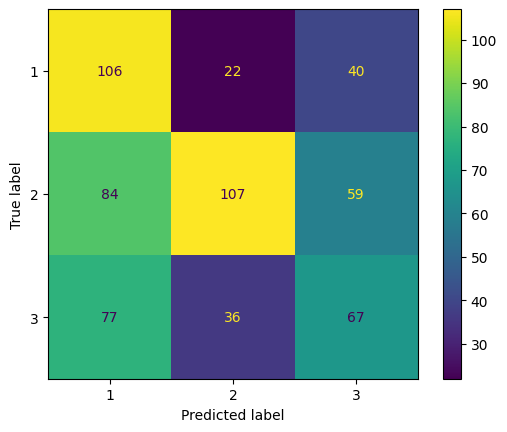

In [ ]:
# Confusion matris
cm = confusion_matrix(label_test, y_pred_class)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn3.classes_)
disp.plot()

# F1-score, precision ve recall'in harmonik ortalamasıdır ve sınıflandırma modelinin ne kadar dengeli bir şekilde çalıştığını gösterir. Accuracy, doğru sınıflandırılan örneklerin oranını ifade eder.

K-NN algoritması k=3 parametresiyle uygulandığında, TF-IDF vektörlerini kullanarak yapılan sınıflandırmada %47'lik bir doğruluk elde edilmiştir.
F1-Score: F1-Score, modelin hem hassasiyet (precision) hem de duyarlılık (recall) değerlerini dikkate alarak bir ölçüdür. İncelediğimiz sonuçlara göre, sınıf bazında F1-Score değerleri şu şekildedir:

Sınıf 1 için: 0.49
Sınıf 2 için: 0.52
Sınıf 3 için: 0.39

Tablonun çapraz bölümü (diagonal) ise doğru şekilde sınıflandırılan örnekleri temsil eder. Örneğin, (1,1) hücresindeki 106 değeri, gerçek sınıfı 1 olan ve sınıfı 1 olarak doğru tahmin edilen örnek sayısını gösterir.

Tablonun dışındaki değerler ise yanlış sınıflandırılan örnekleri temsil eder. Örneğin, (1,2) hücresindeki 22 değeri, gerçek sınıfı 1 olan ancak sınıfı 2 olarak yanlış tahmin edilen örnek sayısını gösterir.
Gerçek sınıfı 1 ve 2 olan değerlerin çoğunlukla doğru sınıflandırıldığını görebiliriz.

k = 5 için

In [ ]:
# KNN sınıflandırıcı k=5
knn5 = KNeighborsClassifier(n_neighbors=5)

In [ ]:
#modeli eğitin
knn5.fit(m_train, label_train)

KNeighborsClassifier()

In [ ]:
# tahmin
y_pred_class = knn5.predict(m_test)
y_pred_class

array([1, 1, 2, 1, 1, 3, 2, 1, 2, 3, 2, 1, 3, 1, 2, 3, 1, 2, 2, 1, 3, 1,
       2, 1, 2, 1, 3, 1, 2, 3, 3, 3, 1, 2, 1, 2, 1, 1, 3, 1, 3, 3, 1, 2,
       2, 2, 1, 2, 2, 3, 2, 1, 1, 1, 1, 1, 2, 1, 2, 1, 2, 2, 3, 1, 1, 1,
       2, 1, 1, 2, 1, 2, 3, 1, 1, 1, 1, 3, 3, 2, 2, 2, 3, 3, 1, 2, 2, 1,
       1, 2, 2, 2, 1, 2, 2, 2, 1, 1, 1, 2, 3, 3, 2, 1, 3, 2, 1, 2, 1, 1,
       2, 2, 1, 3, 1, 1, 3, 2, 2, 2, 1, 3, 2, 2, 1, 1, 2, 3, 2, 1, 1, 2,
       2, 1, 1, 1, 3, 1, 1, 1, 3, 3, 1, 1, 2, 1, 2, 2, 1, 2, 2, 1, 2, 2,
       2, 1, 1, 2, 1, 2, 2, 3, 2, 1, 2, 1, 2, 2, 3, 2, 1, 1, 3, 1, 3, 2,
       1, 2, 2, 1, 1, 1, 1, 2, 2, 3, 3, 3, 2, 2, 1, 2, 3, 1, 2, 1, 1, 1,
       2, 2, 1, 1, 1, 1, 1, 1, 1, 2, 2, 3, 2, 2, 1, 2, 3, 3, 2, 1, 2, 1,
       2, 3, 1, 3, 1, 1, 1, 3, 1, 2, 2, 2, 3, 1, 1, 1, 1, 2, 1, 2, 3, 3,
       3, 3, 3, 3, 2, 1, 2, 1, 1, 2, 2, 2, 2, 3, 1, 2, 2, 1, 1, 2, 3, 3,
       1, 1, 2, 1, 2, 1, 3, 1, 3, 1, 1, 1, 2, 2, 2, 1, 1, 2, 3, 1, 3, 3,
       2, 3, 2, 2, 3, 2, 3, 3, 1, 3, 1, 2, 1, 2, 1,

In [ ]:
# Accuracy skoru hesaplayın
accuracy5 = accuracy_score(label_test, y_pred_class)
print("Accuracy:", accuracy5)

Accuracy: 0.47491638795986624


In [ ]:
# F1 skoru hesaplayın
f1_5 = f1_score(label_test, y_pred_class, average="weighted")
print("F1-Score:", f1_5)

F1-Score: 0.47264257086854294


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:")
print(classification_report(label_test, y_pred_class))
print("Confusion Matrix:")
print(confusion_matrix(label_test, y_pred_class))

Classification Report:
              precision    recall  f1-score   support

           1       0.40      0.58      0.48       168
           2       0.58      0.51      0.55       250
           3       0.42      0.32      0.37       180

    accuracy                           0.47       598
   macro avg       0.47      0.47      0.46       598
weighted avg       0.49      0.47      0.47       598

Confusion Matrix:
[[ 98  39  31]
 [ 74 128  48]
 [ 70  52  58]]


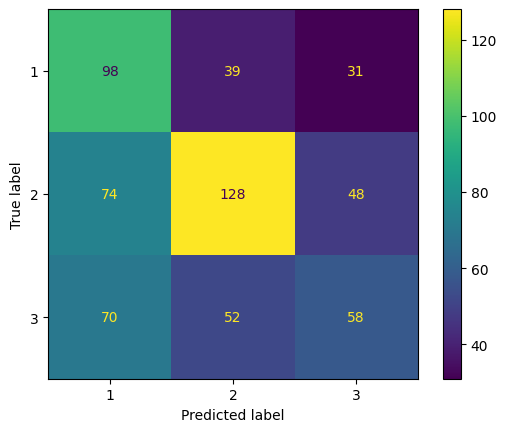

In [ ]:
# Confusion matris
cm = confusion_matrix(label_test, y_pred_class)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn5.classes_)
disp.plot()

Bu durumda, k=5 için sınıflandırma modelinin ortalama bir performans sergilediğini söyleyebiliriz. Precision, recall ve f1-score değerleri sınıflar arasında dengeli bir şekilde dağılmıştır. Accuracy değeri ise yaklaşık olarak %47'dir.

Karmaşıklık matrisine baktığımızda, sınıf 2'nin en doğru şekilde tahmin edildiğini görebiliriz. Ancak, sınıf 1 ve sınıf 3 için yanlış tahminlerin olduğunu gözlemleyebiliriz. Özellikle sınıf 3 için düşük bir recall değeri olduğunu görüyoruz, yani gerçek sınıfı 3 olan örneklerin büyük bir kısmı doğru bir şekilde sınıflandırılamamıştır.

k = 10 için

In [ ]:
knn10 = KNeighborsClassifier(n_neighbors=10)

In [ ]:
knn10.fit(m_train, label_train)

KNeighborsClassifier(n_neighbors=10)

In [ ]:
# tahmin
y_pred_class = knn10.predict(m_test)
y_pred_class

array([2, 1, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 1, 2, 2, 3, 3, 2, 2, 1, 2, 1,
       3, 1, 2, 1, 2, 1, 2, 3, 2, 2, 1, 2, 1, 1, 1, 1, 3, 1, 1, 2, 1, 3,
       3, 2, 1, 2, 2, 3, 1, 3, 3, 1, 1, 3, 2, 1, 2, 2, 3, 2, 3, 1, 1, 1,
       3, 1, 1, 2, 1, 2, 3, 3, 1, 1, 1, 3, 3, 3, 1, 2, 1, 3, 3, 2, 2, 3,
       2, 2, 3, 2, 2, 2, 2, 2, 1, 3, 2, 2, 2, 3, 3, 1, 3, 2, 2, 2, 1, 1,
       3, 2, 1, 3, 2, 1, 3, 2, 1, 1, 2, 2, 2, 2, 1, 1, 2, 3, 1, 1, 2, 2,
       2, 1, 1, 1, 3, 1, 3, 1, 3, 3, 1, 1, 2, 1, 2, 2, 1, 2, 2, 1, 1, 2,
       2, 1, 1, 2, 2, 2, 2, 3, 2, 2, 2, 1, 2, 2, 3, 2, 1, 1, 3, 2, 3, 3,
       1, 3, 2, 1, 3, 1, 1, 2, 2, 1, 3, 3, 2, 1, 2, 2, 3, 2, 2, 2, 1, 1,
       3, 1, 1, 1, 3, 1, 1, 1, 1, 2, 3, 3, 2, 2, 1, 2, 3, 2, 2, 3, 2, 2,
       3, 3, 1, 3, 3, 1, 1, 1, 1, 2, 1, 2, 2, 1, 2, 1, 1, 3, 1, 2, 3, 2,
       3, 3, 3, 3, 2, 1, 2, 2, 1, 3, 2, 3, 2, 3, 1, 2, 2, 1, 1, 3, 3, 3,
       2, 1, 2, 1, 2, 1, 2, 1, 3, 3, 1, 1, 2, 2, 2, 1, 1, 2, 2, 1, 3, 3,
       2, 3, 3, 2, 2, 2, 3, 3, 1, 3, 1, 2, 1, 2, 1,

In [ ]:
accuracy10 = accuracy_score(label_test, y_pred_class)
print("Accuracy:", accuracy10)

Accuracy: 0.4866220735785953


In [ ]:
# F1 skoru hesaplayın
f1_10 = f1_score(label_test, y_pred_class, average="weighted")
print("F1-Score:", f1_10)

F1-Score: 0.4850411537191052


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:")
print(classification_report(label_test, y_pred_class))
print("Confusion Matrix:")
print(confusion_matrix(label_test, y_pred_class))

Classification Report:
              precision    recall  f1-score   support

           1       0.46      0.51      0.48       168
           2       0.57      0.57      0.57       250
           3       0.39      0.35      0.37       180

    accuracy                           0.49       598
   macro avg       0.47      0.48      0.47       598
weighted avg       0.48      0.49      0.49       598

Confusion Matrix:
[[ 86  45  37]
 [ 46 142  62]
 [ 56  61  63]]


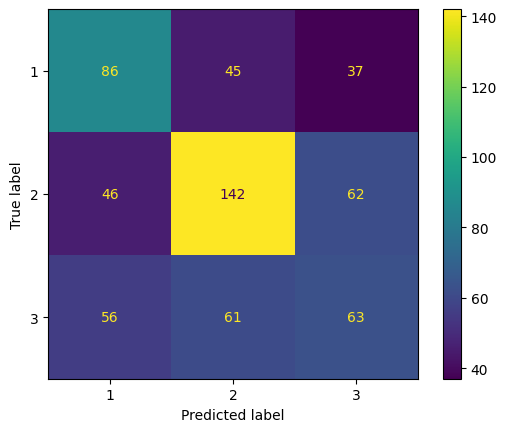

In [ ]:
# Confusion matris
cm = confusion_matrix(label_test, y_pred_class)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=knn10.classes_)
disp.plot()

Precision, recall ve f1-score değerleri sınıflar arasında dengeli bir şekilde dağılmıştır. Accuracy değeri ise yaklaşık %49'dur.

Karmaşıklık matrisine baktığımızda, sınıf 2'nin en iyi şekilde tahmin edildiğini görüyoruz. Ancak, sınıf 1 ve sınıf 3 için yanlış tahminlerin olduğunu gözlemleyebiliriz. Özellikle sınıf 3 için düşük bir recall değeri olduğunu görüyoruz, yani gerçek sınıfı 3 olan örneklerin büyük bir kısmı doğru bir şekilde sınıflandırılamamıştır.

#KNN ve Word2Vec

In [ ]:
#Word2Vec modeli
sentences = [text.split() for text in df["list3"].tolist()]
model = gensim.models.Word2Vec(sentences, vector_size=100, window=5, min_count=1, workers=4)


In [ ]:
#Metinlerin Word2Vec
def get_word2vec_embeddings(text):
    words = text.split()
    embeddings = [model.wv[word] for word in words if word in model.wv.key_to_index]
    if len(embeddings) > 0:
        return np.mean(embeddings, axis=0)
    else:
        return np.zeros(100)  # Eğer kelime bulunamazsa sıfırlardan oluşan bir vektör oluştur

df["word2vec_emb"] = df["list3"].apply(get_word2vec_embeddings)

In [ ]:
#Eğitim ve test
from sklearn.model_selection import train_test_split

X = np.vstack(df["word2vec_emb"].to_numpy())
y = df["Label"].to_numpy()

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

k=5

In [ ]:
knn_to_w2v_5 = KNeighborsClassifier(n_neighbors=5)
knn_to_w2v_5.fit(X_train, y_train)

y_pred_5 = knn_to_w2v_5.predict(X_test)

In [ ]:
# k = 5
from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:")
print(classification_report(y_test, y_pred_5))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_5))

Classification Report:
              precision    recall  f1-score   support

           1       0.33      0.25      0.29       168
           2       0.46      0.70      0.55       250
           3       0.42      0.21      0.28       180

    accuracy                           0.42       598
   macro avg       0.40      0.39      0.37       598
weighted avg       0.41      0.42      0.39       598

Confusion Matrix:
[[ 42 102  24]
 [ 47 175  28]
 [ 37 106  37]]


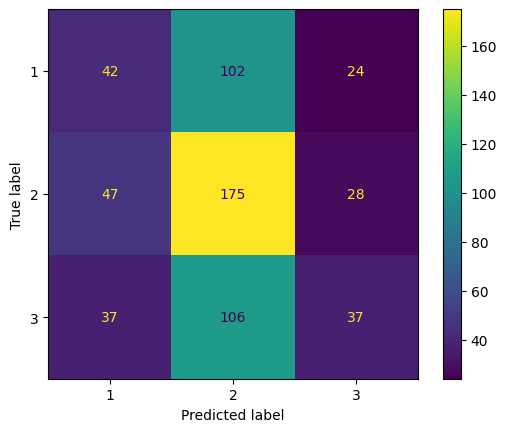

In [ ]:
# Confusion matris
cm_w2v_5 = confusion_matrix(y_test, y_pred_5)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_w2v_5, display_labels=knn_to_w2v_5.classes_)
disp.plot()

 k=5 için Word2Vec tabanlı KNN sınıflandırma modelinin düşük bir performans sergilediğini söyleyebiliriz. Precision, recall ve f1-score değerleri düşük ve sınıflar arasında dengesiz bir dağılıma sahiptir. Accuracy değeri ise yaklaşık %44'tür.

Karmaşıklık matrisine baktığımızda, sınıf 2'nin en iyi şekilde tahmin edildiğini görebiliriz.
Özellikle sınıf 1 için düşük bir recall değeri olduğunu görüyoruz, yani gerçek sınıfı 1 olan örneklerin çoğu yanlış bir şekilde sınıflandırılmıştır.

k = 10

In [ ]:
knn_to_w2v_10 = KNeighborsClassifier(n_neighbors=10)
knn_to_w2v_10.fit(X_train, y_train)

y_pred_10 = knn_to_w2v_10.predict(X_test)

In [ ]:

print("Classification Report:")
print(classification_report(y_test, y_pred_10))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_10))

Classification Report:
              precision    recall  f1-score   support

           1       0.42      0.17      0.24       168
           2       0.44      0.80      0.57       250
           3       0.41      0.17      0.24       180

    accuracy                           0.43       598
   macro avg       0.42      0.38      0.35       598
weighted avg       0.42      0.43      0.38       598

Confusion Matrix:
[[ 29 122  17]
 [ 22 201  27]
 [ 18 132  30]]


 k=10 için Word2Vec tabanlı KNN sınıflandırma modelinin orta düzeyde bir performans sergilediğini söyleyebiliriz. Precision, recall ve f1-score değerleri orta seviyededir ve sınıflar arasında dengesiz bir dağılıma sahiptir. Accuracy değeri ise yaklaşık %45'tir.
 Özellikle sınıf 1 için düşük bir recall değeri olduğunu görüyoruz, yani gerçek sınıfı 1 olan örneklerin çoğu yanlış bir şekilde sınıflandırılmıştır.

k = 20

In [ ]:
knn_to_w2v_20 = KNeighborsClassifier(n_neighbors=20)
knn_to_w2v_20.fit(X_train, y_train)

y_pred_20 = knn_to_w2v_20.predict(X_test)

In [ ]:
print("Classification Report:")
print(classification_report(y_test, y_pred_20))

print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred_20))

Classification Report:
              precision    recall  f1-score   support

           1       0.43      0.12      0.19       168
           2       0.44      0.89      0.59       250
           3       0.40      0.11      0.17       180

    accuracy                           0.44       598
   macro avg       0.42      0.37      0.32       598
weighted avg       0.42      0.44      0.35       598

Confusion Matrix:
[[ 20 134  14]
 [ 12 223  15]
 [ 15 146  19]]


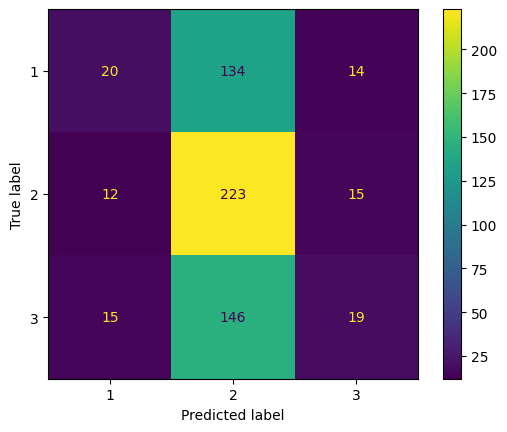

In [ ]:
# Confusion matris
cm_w2v_20 = confusion_matrix(y_test, y_pred_20)
disp = ConfusionMatrixDisplay(confusion_matrix=cm_w2v_20, display_labels=knn_to_w2v_20.classes_)
disp.plot()

 k=20 için Word2Vec tabanlı KNN sınıflandırma modelinin düşük bir performans sergilediğini söyleyebiliriz. Precision, recall ve f1-score değerleri düşüktür ve sınıflar arasında dengesiz bir dağılıma sahiptir. Accuracy değeri ise yaklaşık %44'tür.sınıf 2'nin iyi bir şekilde tahmin edildiğini görebiliriz.
 sınıf 1 için düşük bir recall değeri olduğunu görüyoruz, yani gerçek sınıfı 1 olan örneklerin çoğu yanlış bir şekilde sınıflandırılmıştır.

# **Word2vec Vektör Görselleştirme**

In [ ]:
df2= pd.read_csv("nlp_proje_metin_gorsellestirme.csv",index_col=0)
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 12132 entries, 0 to 12131
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Text    12126 non-null  object
dtypes: object(1)
memory usage: 189.6+ KB


In [ ]:
df2.describe()

,Text
count,12126
unique,10613
top,merhaba cep telefonu numaranizi mesaj iletmeni...
freq,175


In [ ]:
df2.head()

,Text
0,merhaba can gurler belirttiginiz urunle ilgili...
1,-bir mesaj atsa! *mesaj sesi* (şok ifadesi) no...
2,mbps fiber baglantim var ama nedense ustunu go...
3,fiberin hizi vatandasin cebindeki parayi nasil...
4,sakin vestel almayinnher urunu bozuk arkasinds...


In [ ]:
df2["Text"]=df2["Text"].str.strip()
df2["Text"].head()

0    merhaba can gurler belirttiginiz urunle ilgili...
1    -bir mesaj atsa! *mesaj sesi* (şok ifadesi) no...
2    mbps fiber baglantim var ama nedense ustunu go...
3    fiberin hizi vatandasin cebindeki parayi nasil...
4    sakin vestel almayinnher urunu bozuk arkasinds...
Name: Text, dtype: object

In [ ]:
df2.isnull().sum()

Text    6
dtype: int64

In [ ]:
df2.dropna(inplace=True)
df2.head()
df2.reset_index(drop=True, inplace=True)

In [ ]:
df2.isnull().sum()

Text    0
dtype: int64

In [ ]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
STOP_WORDS = nltk.corpus.stopwords.words()

In [ ]:
source = urlopen("https://github.com/stopwords-iso/stopwords-tr/blob/master/stopwords-tr.txt").read()
soup = BeautifulSoup(source, "lxml")
print(set([text.parent.name for text in soup.find_all(text=True)]))

{'label', 'h1', 'strong', 'input-demux', 'li', 'html', 'details', 'details-dialog', 'head', 'svg', 'tr', 'ul', 'clipboard-copy', 'ref-selector', '[document]', 'div', 'details-menu', 'span', 'tab-container', 'a', 'modal-dialog', 'h3', 'include-fragment', 'template', 'nav', 'summary', 'title', 'footer', 'table', 'body', 'button', 'form', 'main', 'header', 'turbo-frame', 'h2', 'td'}


<ipython-input-264-2ebe5de941ab>:3: DeprecationWarning: The 'text' argument to find()-type methods is deprecated. Use 'string' instead.
  print(set([text.parent.name for text in soup.find_all(text=True)]))


In [ ]:
stopwords = ''

for paragraph in soup.find_all("tr"):
    stopwords += paragraph.text

stopwords = stopwords.split()
stopwords

['acaba',
 'acep',
 'adamakıllı',
 'adeta',
 'ait',
 'altmýþ',
 'altmış',
 'altý',
 'altı',
 'ama',
 'amma',
 'anca',
 'ancak',
 'arada',
 'artýk',
 'aslında',
 'aynen',
 'ayrıca',
 'az',
 'açıkça',
 'açıkçası',
 'bana',
 'bari',
 'bazen',
 'bazý',
 'bazı',
 'başkası',
 'baţka',
 'belki',
 'ben',
 'benden',
 'beni',
 'benim',
 'beri',
 'beriki',
 'beþ',
 'beş',
 'beţ',
 'bilcümle',
 'bile',
 'bin',
 'binaen',
 'binaenaleyh',
 'bir',
 'biraz',
 'birazdan',
 'birbiri',
 'birden',
 'birdenbire',
 'biri',
 'birice',
 'birileri',
 'birisi',
 'birkaç',
 'birkaçı',
 'birkez',
 'birlikte',
 'birçok',
 'birçoğu',
 'birþey',
 'birþeyi',
 'birşey',
 'birşeyi',
 'birţey',
 'bitevi',
 'biteviye',
 'bittabi',
 'biz',
 'bizatihi',
 'bizce',
 'bizcileyin',
 'bizden',
 'bize',
 'bizi',
 'bizim',
 'bizimki',
 'bizzat',
 'boşuna',
 'bu',
 'buna',
 'bunda',
 'bundan',
 'bunlar',
 'bunları',
 'bunların',
 'bunu',
 'bunun',
 'buracıkta',
 'burada',
 'buradan',
 'burası',
 'böyle',
 'böylece',
 'böylecene',


In [ ]:
text = df2["Text"]
text.head()

0    merhaba can gurler belirttiginiz urunle ilgili...
1    -bir mesaj atsa! *mesaj sesi* (şok ifadesi) no...
2    mbps fiber baglantim var ama nedense ustunu go...
3    fiberin hizi vatandasin cebindeki parayi nasil...
4    sakin vestel almayinnher urunu bozuk arkasinds...
Name: Text, dtype: object

In [ ]:
# harf olmayan karakterleri boşluk yapar ve stopwords dışındaki kelimeleri seçer
liste=[]
for j in range(len(df2)):
    txt = re.sub("[^a-zA-ZüığıçöşÇŞİÜĞÖ]", ' ', df2.Text[j])
    txt = txt.lower()
    txt = txt.split()
    txt = [i for i in txt if i not in stopwords]
    txttotal = " ".join(txt)
    liste.append(txttotal)

In [ ]:
liste[0:5]

['merhaba can gurler belirttiginiz urunle detayli bilgiye adresimizden ulasabilirsiniz ilginize tesekkur ederiz',
 'mesaj atsa mesaj sesi şok ifadesi noooolur sayın abonemiz amk turkcell',
 'mbps fiber baglantim ustunu goremedim gece arasi girsem dersin turktelekom saka gibisiniz',
 'fiberin hizi vatandasin cebindeki parayi nasil aliriza odakli olmus',
 'sakin vestel almayinnher urunu bozuk arkasinds durmuyorlar']

In [ ]:
df2["liste"] = liste
df2

,Text,liste
0,merhaba can gurler belirttiginiz urunle ilgili...,merhaba can gurler belirttiginiz urunle detayl...
1,-bir mesaj atsa! *mesaj sesi* (şok ifadesi) no...,mesaj atsa mesaj sesi şok ifadesi noooolur say...
2,mbps fiber baglantim var ama nedense ustunu go...,mbps fiber baglantim ustunu goremedim gece ara...
3,fiberin hizi vatandasin cebindeki parayi nasil...,fiberin hizi vatandasin cebindeki parayi nasil...
4,sakin vestel almayinnher urunu bozuk arkasinds...,sakin vestel almayinnher urunu bozuk arkasinds...
5,devre bende var oyle hizli degil bosver,devre bende oyle hizli degil bosver
6,merhaba hikmet yuce indirimlerimizle ilgili on...,merhaba hikmet yuce indirimlerimizle onceden b...
7,mazen borghal,mazen borghal
8,ne fiber gucuymus aydir hat cekemediniz ankara...,fiber gucuymus aydir hat cekemediniz ankara go...
9,erol köse:turkcell bayisinde ''kontör bulunur'...,erol köse turkcell bayisinde kontör bulunur ya...


In [ ]:
# tek karakterleri kaldırma
liste2=[]
for j in range(len(df2)):
    txt=re.sub(r"(?:^| )\w(?:$| )",' ', df2.liste[j])
    txt = txt.lower()
    txt=txt.split()
    txt=[i for i in txt if i not in stopwords]
    txttotal=" ".join(txt)
    liste2.append(txttotal)
df2["liste2"] = liste2
df2.head()

,Text,liste,liste2
0,merhaba can gurler belirttiginiz urunle ilgili...,merhaba can gurler belirttiginiz urunle detayl...,merhaba can gurler belirttiginiz urunle detayl...
1,-bir mesaj atsa! *mesaj sesi* (şok ifadesi) no...,mesaj atsa mesaj sesi şok ifadesi noooolur say...,mesaj atsa mesaj sesi şok ifadesi noooolur say...
2,mbps fiber baglantim var ama nedense ustunu go...,mbps fiber baglantim ustunu goremedim gece ara...,mbps fiber baglantim ustunu goremedim gece ara...
3,fiberin hizi vatandasin cebindeki parayi nasil...,fiberin hizi vatandasin cebindeki parayi nasil...,fiberin hizi vatandasin cebindeki parayi nasil...
4,sakin vestel almayinnher urunu bozuk arkasinds...,sakin vestel almayinnher urunu bozuk arkasinds...,sakin vestel almayinnher urunu bozuk arkasinds...


In [ ]:
# temizlenmiş metinden en çok kullanılan 200 kelimeyi bulma
#kelime frekansı
from collections import Counter
Counter(" ".join(liste2).split()).most_common(200)

[('turkcell', 2034),
 ('icin', 1533),
 ('internet', 1329),
 ('merhaba', 1253),
 ('mesaj', 1074),
 ('turk', 1042),
 ('telekom', 1032),
 ('telefon', 755),
 ('fiber', 592),
 ('telefonu', 562),
 ('musteri', 527),
 ('hic', 506),
 ('cep', 503),
 ('sizinle', 502),
 ('ederiz', 492),
 ('hakkinda', 474),
 ('numaranizi', 472),
 ('konu', 471),
 ('avea', 470),
 ('cekmiyor', 466),
 ('bilgi', 462),
 ('reklam', 448),
 ('kisa', 428),
 ('nasil', 423),
 ('rica', 409),
 ('once', 403),
 ('hala', 391),
 ('iletisime', 380),
 ('iletmenizi', 376),
 ('size', 370),
 ('degil', 353),
 ('iletisim', 343),
 ('artik', 342),
 ('tesekkurler', 341),
 ('para', 337),
 ('hizmet', 309),
 ('bilgilerinizi', 301),
 ('gun', 300),
 ('zaman', 298),
 ('alt', 296),
 ('bende', 289),
 ('guzel', 289),
 ('boyle', 285),
 ('detayli', 279),
 ('iptal', 271),
 ('baska', 263),
 ('fatura', 258),
 ('teknosa', 252),
 ('yardimci', 251),
 ('misiniz', 249),
 ('tarafiniza', 243),
 ('hat', 242),
 ('vodafone', 238),
 ('ayni', 236),
 ('ttnet', 235),
 (

In [ ]:
#boş değer kontrolü
df2_index=df2[df2["liste"].str[0].isnull()].index
df2 = df2.drop(df2_index)
df2 = df2.reset_index()

del df2["index"]

df2[df2["liste"].str[0].isnull()]

,Text,liste,liste2


In [ ]:
df2.head()

,Text,liste,liste2
0,merhaba can gurler belirttiginiz urunle ilgili...,merhaba can gurler belirttiginiz urunle detayl...,merhaba can gurler belirttiginiz urunle detayl...
1,-bir mesaj atsa! *mesaj sesi* (şok ifadesi) no...,mesaj atsa mesaj sesi şok ifadesi noooolur say...,mesaj atsa mesaj sesi şok ifadesi noooolur say...
2,mbps fiber baglantim var ama nedense ustunu go...,mbps fiber baglantim ustunu goremedim gece ara...,mbps fiber baglantim ustunu goremedim gece ara...
3,fiberin hizi vatandasin cebindeki parayi nasil...,fiberin hizi vatandasin cebindeki parayi nasil...,fiberin hizi vatandasin cebindeki parayi nasil...
4,sakin vestel almayinnher urunu bozuk arkasinds...,sakin vestel almayinnher urunu bozuk arkasinds...,sakin vestel almayinnher urunu bozuk arkasinds...


In [ ]:
sentences2 = [text.split() for text in df2["liste2"]]
sentences2

[['merhaba',
  'can',
  'gurler',
  'belirttiginiz',
  'urunle',
  'detayli',
  'bilgiye',
  'adresimizden',
  'ulasabilirsiniz',
  'ilginize',
  'tesekkur',
  'ederiz'],
 ['mesaj',
  'atsa',
  'mesaj',
  'sesi',
  'şok',
  'ifadesi',
  'noooolur',
  'sayın',
  'abonemiz',
  'amk',
  'turkcell'],
 ['mbps',
  'fiber',
  'baglantim',
  'ustunu',
  'goremedim',
  'gece',
  'arasi',
  'girsem',
  'dersin',
  'turktelekom',
  'saka',
  'gibisiniz'],
 ['fiberin',
  'hizi',
  'vatandasin',
  'cebindeki',
  'parayi',
  'nasil',
  'aliriza',
  'odakli',
  'olmus'],
 ['sakin',
  'vestel',
  'almayinnher',
  'urunu',
  'bozuk',
  'arkasinds',
  'durmuyorlar'],
 ['devre', 'bende', 'oyle', 'hizli', 'degil', 'bosver'],
 ['merhaba',
  'hikmet',
  'yuce',
  'indirimlerimizle',
  'onceden',
  'bilgi',
  'paylasimi',
  'yapamiyoruz',
  'kampanyalarimizdan',
  'herkesten',
  'once',
  'haberdar',
  'icin',
  'sayfamizi',
  'sik',
  'sik',
  'ziyaret',
  'etmenizi',
  'oneririz',
  'ilginize',
  'tesekkur

In [ ]:
model2 = Word2Vec(sentences2, vector_size=100, window=5, min_count=10, workers=4)

In [ ]:
similar_words = model2.wv.most_similar("telefon", topn=10)

In [ ]:
X = model2.wv[model2.wv.key_to_index]
tsne = TSNE(n_components=2, random_state=42)
X_tsne = tsne.fit_transform(X)

plt.figure(figsize=(100, 100))
sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1])
for i, word in enumerate(model2.wv.key_to_index):
    if word in similar_words:
        plt.annotate(word, (X_tsne[i, 0], X_tsne[i, 1]), color='red')
    else:
        plt.annotate(word, (X_tsne[i, 0], X_tsne[i, 1]), alpha=0.5)
plt.xlabel("Dimension 1")
plt.ylabel("Dimension 2")
plt.title("Word2Vec Embeddings Visualization")
plt.show()


In [ ]:
from sklearn.manifold import TSNE

In [ ]:
!pip install wordcloud

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from wordcloud import WordCloud, ImageColorGenerator
from PIL import Image
import numpy as np


In [ ]:
movie_mask = np.array(Image.open("monalisa.jpeg"))
movie_mask

array([[[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       ...,

       [[254, 254, 254],
        [254, 254, 254],
        [254, 254, 254],
        ...,
        [254, 254, 254],
        [254, 254, 254],
        [254, 254, 254]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]],

       [[255, 255, 255],
        [255, 255, 255],
        [255, 255, 255],
        ...,
        [255, 255, 255],
        [255, 255, 255],
        [255, 255, 255]]

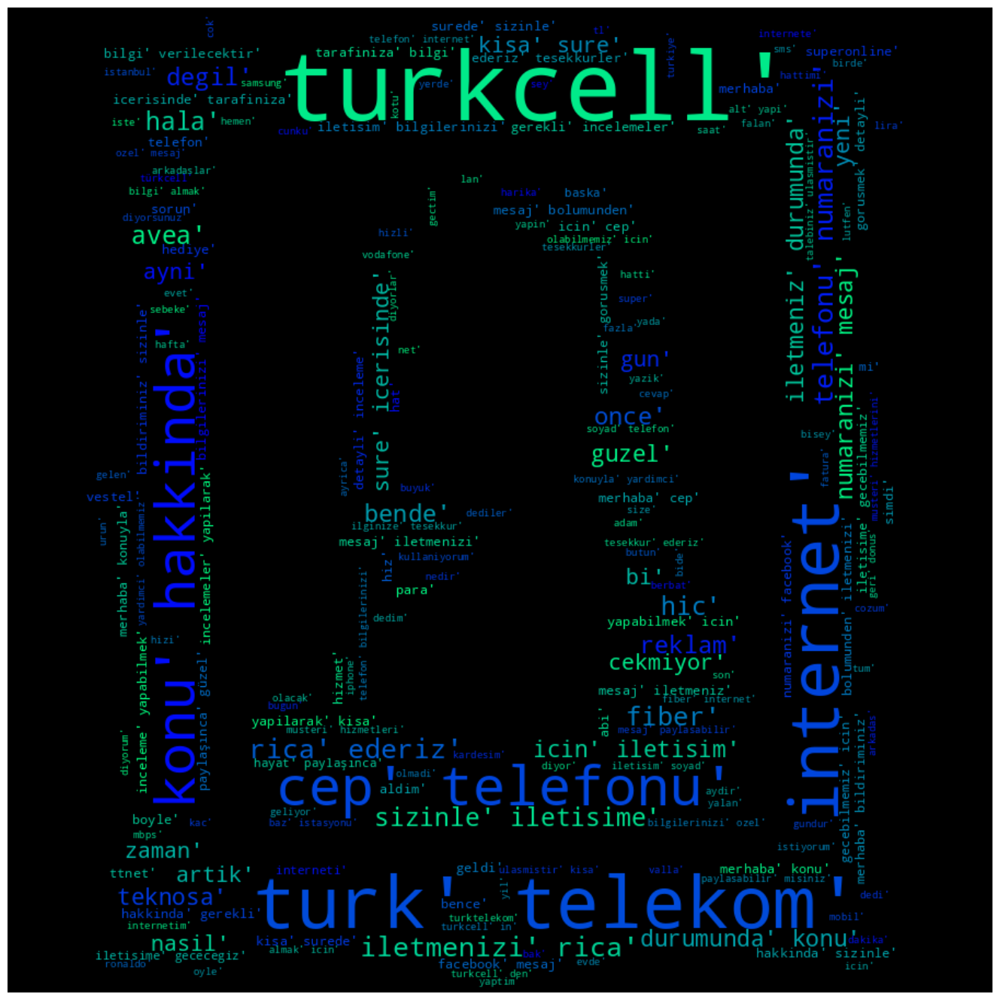

In [ ]:
text_ = " ".join(map(str, sentences2))
wordcloud = WordCloud(width = 3000,
                      height = 3000,
                      max_font_size = 300,
                      mask = movie_mask,
                      colormap = "winter").generate(text_)

plt.figure(figsize = (20,17))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()



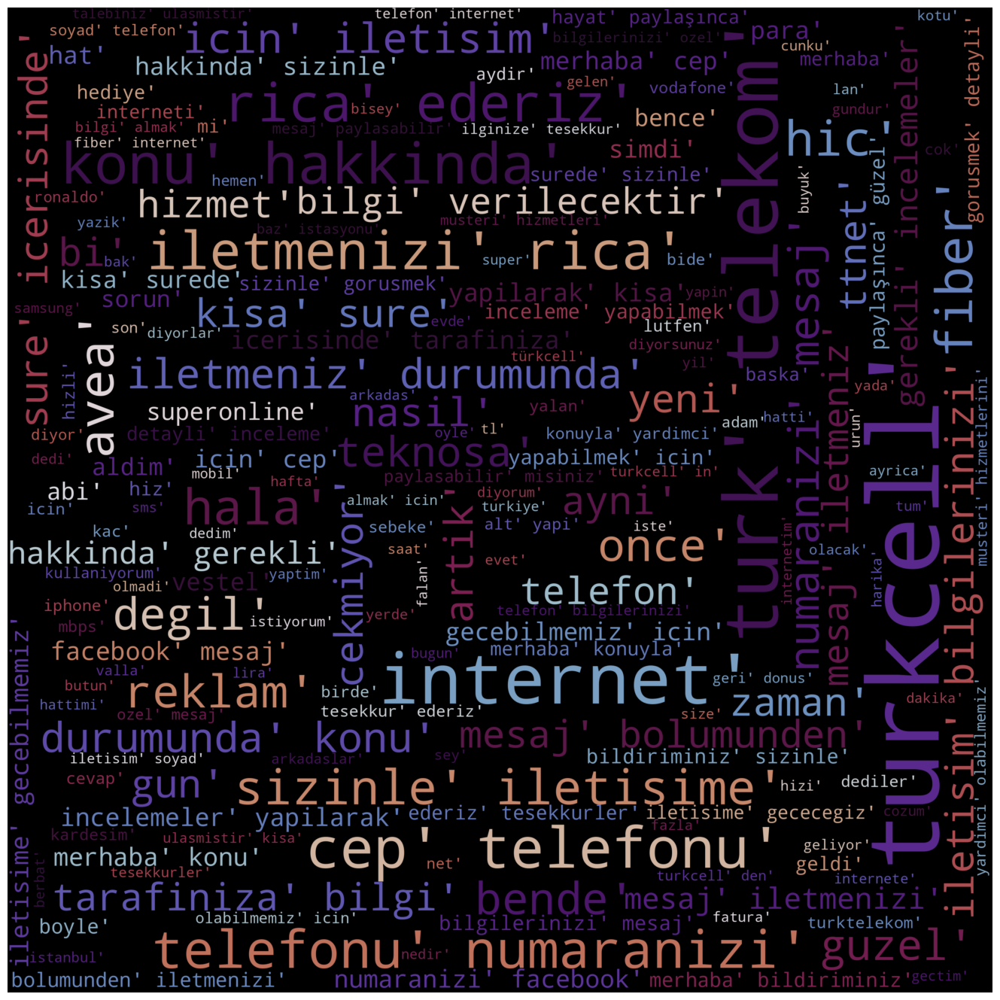

In [ ]:
text_ = " ".join(map(str, sentences2))

wordcloud = WordCloud(width = 3000,
                      height = 3000,
                      max_font_size = 300,
                      colormap = "twilight_shifted").generate(text_)

plt.figure(figsize = (20,17))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

In [ ]:
joker_mask = np.array(Image.open("joker.jpg"))
joker_mask

array([[[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0]],

       ...,

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [18, 18, 18],
        [20, 20, 20],
        [ 0,  0,  0]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 6,  6,  6],
        [ 5,  5,  5],
        [ 4,  4,  4]],

       [[ 0,  0,  0],
        [ 0,  0,  0],
        [ 0,  0,  0],
        ...,
        [ 2,  2,  2],
        [ 2,  2,  2],
        [ 2,  2,  2]]], dtype=uint8)

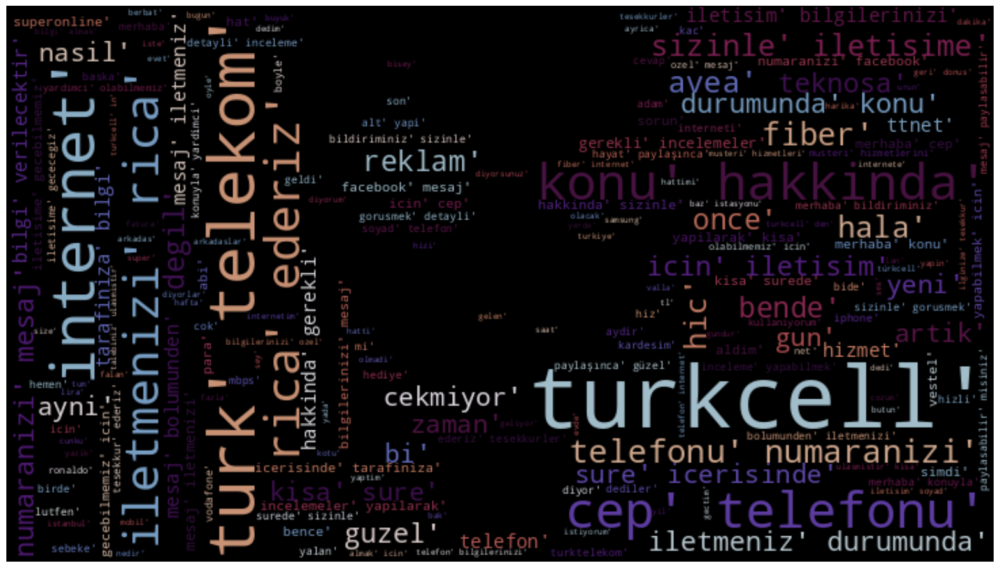

In [ ]:
text_ = " ".join(map(str, sentences2))
wordcloud = WordCloud(width = 3000,
                      height = 3000,
                      max_font_size = 300,
                      mask = joker_mask,
                      colormap = "twilight_shifted").generate(text_)

plt.figure(figsize = (20,60))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

In [ ]:
model3 = Word2Vec(sentences2, vector_size=100, window=5, min_count=5, workers=4)
model3

In [ ]:
model3.wv["turkcell"]

array([-0.05227868, -0.02715043,  0.66107833,  0.20394427,  0.04032693,
       -0.5961493 ,  0.3345357 ,  0.95032495, -0.7468199 , -0.3678869 ,
       -0.05086467, -0.5812215 , -0.13149594,  0.27976623, -0.3323581 ,
       -0.18497033,  0.23634832, -0.49176443, -0.04164079, -0.9373616 ,
        0.32665908,  0.4406081 ,  0.30176255, -0.2581611 , -0.06198843,
        0.2508529 ,  0.09806456,  0.00347026, -0.69998103,  0.065989  ,
        0.52293575, -0.1604247 ,  0.19768117, -0.54281807, -0.10730833,
        0.16379943,  0.070679  , -0.79962426, -0.20804234, -1.1355647 ,
       -0.12703258, -0.39202443, -0.05892786, -0.21319905,  0.5666127 ,
       -0.06257925, -0.55432856, -0.00813875,  0.24199028,  0.46221888,
       -0.05666794,  0.10248791, -0.49677113, -0.18918903, -0.5549762 ,
       -0.01565063,  0.21832706,  0.08942133, -0.8042552 , -0.11297922,
        0.19331288, -0.02691046, -0.5226032 , -0.07641926, -0.35725167,
        0.6057794 , -0.05571077,  0.04040677, -0.6803285 ,  0.55

In [ ]:
model.wv.most_similar("turkcell")

[('tl', 0.9370330572128296),
 ('bi', 0.9368234872817993),
 ('türkcell', 0.9257239699363708),
 ('mi', 0.9172195792198181),
 ('mesaj', 0.915818452835083),
 ('in', 0.91451096534729),
 ('den', 0.9142895340919495),
 ('avea', 0.9112234115600586),
 ('internet', 0.9104167819023132),
 ('vodafone', 0.8876931071281433)]

In [ ]:
model.wv.most_similar("telefon")

[('turkcell', 0.8425549864768982),
 ('internet', 0.8182142376899719),
 ('bi', 0.8132069110870361),
 ('tl', 0.8116581439971924),
 ('den', 0.8032147288322449),
 ('mi', 0.7893556356430054),
 ('avea', 0.7844783663749695),
 ('in', 0.7785327434539795),
 ('türkcell', 0.7784318327903748),
 ('mesaj', 0.7750639319419861)]

In [ ]:
model.wv.most_similar("reklam")

[('in', 0.782528281211853),
 ('turkcell', 0.777744472026825),
 ('tl', 0.7457310557365417),
 ('türkcell', 0.744131863117218),
 ('bi', 0.7196494936943054),
 ('dk', 0.714949369430542),
 ('bugün', 0.7009832859039307),
 ('mesaj', 0.6997895836830139),
 ('turkcel', 0.6991865634918213),
 ('vodafone', 0.6939471364021301)]

In [ ]:
from sklearn.manifold import TSNE

In [ ]:
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def closestwords_tsneplot(model, word):
    word_vectors = np.empty((0, model.vector_size))
    word_labels = [word]

    close_words = model.wv.most_similar(word)

    word_vectors = np.append(word_vectors, [model.wv[word]], axis=0)

    for w, _ in close_words:
        word_labels.append(w)
        word_vectors = np.append(word_vectors, [model.wv[w]], axis=0)

    tsne = TSNE(random_state=0, perplexity=5)
    Y = tsne.fit_transform(word_vectors)

    x_coords = Y[:, 0]
    y_coords = Y[:, 1]

    plt.scatter(x_coords, y_coords)

    for label, x, y in zip(word_labels, x_coords, y_coords):
        plt.annotate(label, xy=(x, y), xytext=(5, -2), textcoords="offset points")

    plt.show()



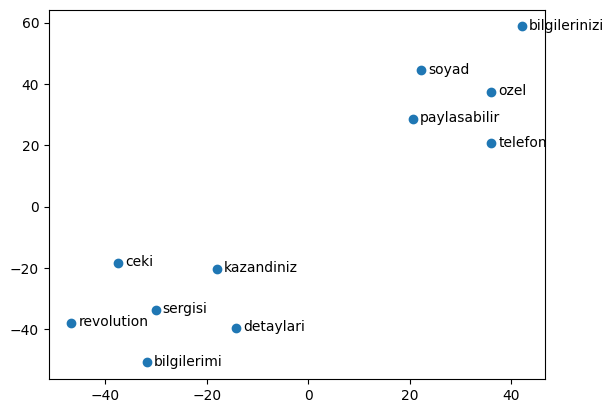

In [ ]:
closestwords_tsneplot(model3, "telefon")

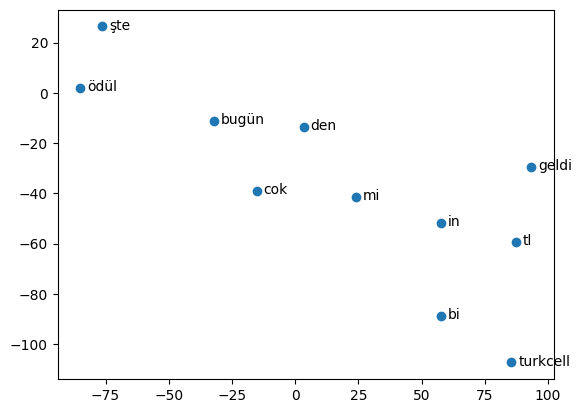

In [ ]:
closestwords_tsneplot(model3, "turkcell")

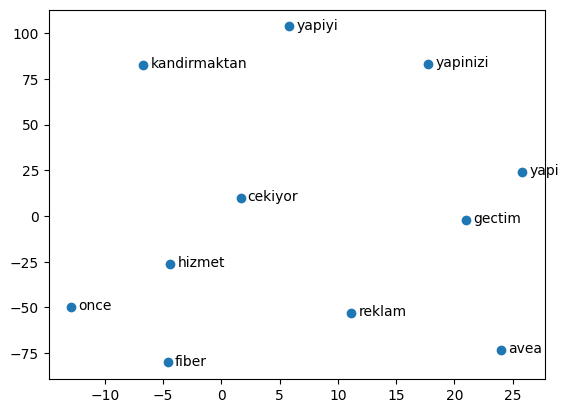

In [ ]:
closestwords_tsneplot(model3, "reklam")